# Home Loan Default Prediction Project

#### PRCP-1006 Capstone Project
**Team ID:**  PTID-CDS-APR-25-2582 

**Project ID:** PRCP-1006-HomeLoanDef  

**Prepared by:** Alvin Reuben Walker

---

### 🧾 Problem Statement
Create a predictive model to identify the factors or customer segments that are eligible for taking a loan and are likely to **default** or **not default** on repayment.

---

## Task 1:-Prepare a complete data analysis report on the given data.

In [1]:
# 1. Import Required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Display settings for better visuals
pd.set_option('display.max_columns', 100)
sns.set(style='darkgrid')

In [2]:
def load_data():
    application_train = pd.read_csv("application_train.csv")
    bureau = pd.read_csv("bureau.csv")
    bureau_balance = pd.read_csv("bureau_balance.csv")
    previous_application = pd.read_csv("previous_application.csv")
    installments = pd.read_csv("installments_payments.csv")
    pos_cash = pd.read_csv("POS_CASH_balance.csv")
    credit_card = pd.read_csv("credit_card_balance.csv")
    return application_train, bureau, bureau_balance, pos_cash, credit_card, previous_application, installments

In [3]:
# Load datasets
application_train, bureau, bureau_balance, pos_cash, credit_card, previous_application, installments = load_data()

In [4]:
## 🏗️  Aggregating External Tables

 # We will aggregate relevant features from external data files like `bureau`, bureau_balance `previous_application`, `installments_payments`, `POS_CASH_balance`, and `credit_card_balance`, then merge them with the main `application_train` dataset.

# Step 1: Aggregate bureau.csv
def aggregate_bureau(bureau):
    return bureau.groupby("SK_ID_CURR").agg({
        "AMT_CREDIT_SUM": "sum",
        "CREDIT_DAY_OVERDUE": "max",
        "DAYS_CREDIT": "mean"
    }).reset_index()

# Step 2: Aggregate previous_application.csv
def aggregate_previous(previous):
    return previous.groupby("SK_ID_CURR").agg({
        "AMT_ANNUITY": "mean",
        "AMT_APPLICATION": "mean",
        "AMT_CREDIT": "mean",
        "RATE_DOWN_PAYMENT": "mean"
    }).reset_index()

# Step 3: Aggregate installments_payments.csv
def aggregate_installments(installments):
    return installments.groupby("SK_ID_CURR").agg({
        "AMT_INSTALMENT": "mean",
        "AMT_PAYMENT": "mean",
        "DAYS_INSTALMENT": "mean"
    }).reset_index()

# Step 4: Aggregate POS_CASH_balance.csv
def aggregate_pos_cash(pos_cash):
    return pos_cash.groupby("SK_ID_CURR").agg({
        "MONTHS_BALANCE": "mean",
        "SK_DPD": "mean",
        "SK_DPD_DEF": "mean"
    }).reset_index()

# Step 5: Aggregate credit_card_balance.csv
def aggregate_credit_card(credit_card):
    return credit_card.groupby("SK_ID_CURR").agg({
        "MONTHS_BALANCE": "mean",
        "AMT_BALANCE": "mean",
        "AMT_CREDIT_LIMIT_ACTUAL": "mean"
    }).reset_index()

# Perform aggregations
bureau_agg = aggregate_bureau(bureau)
prev_agg = aggregate_previous(previous_application)
inst_agg = aggregate_installments(installments)
pos_agg = aggregate_pos_cash(pos_cash)
credit_agg = aggregate_credit_card(credit_card)

# Merge all with application_train
application_train = application_train.merge(bureau_agg, on="SK_ID_CURR", how="left")
application_train = application_train.merge(prev_agg, on="SK_ID_CURR", how="left")
application_train = application_train.merge(inst_agg, on="SK_ID_CURR", how="left")
application_train = application_train.merge(pos_agg, on="SK_ID_CURR", how="left")
application_train = application_train.merge(credit_agg, on="SK_ID_CURR", how="left")

print("✅ Aggregation and merging complete.")


✅ Aggregation and merging complete.


In [5]:
# Final dataset is now merged and ready for model training
application_train.to_csv("final_merged_dataset.csv", index=False)

In [6]:
# Load the merged dataset
data = pd.read_csv("final_merged_dataset.csv")

In [7]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_CREDIT_SUM,CREDIT_DAY_OVERDUE,DAYS_CREDIT,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,RATE_DOWN_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,DAYS_INSTALMENT,MONTHS_BALANCE_x,SK_DPD,SK_DPD_DEF,MONTHS_BALANCE_y,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,...,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,865055.565,0.0,-874.000000,9251.7750,179055.00,179055.00,0.000000,11559.247105,11559.247105,-295.000000,-16.000000,0.0,0.0,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,...,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1017400.500,0.0,-1400.750000,98356.9950,900000.00,1035882.00,NaN,64754.586000,64754.586000,-1378.160000,-45.238095,0.0,0.0,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,189037.800,0.0,-867.000000,5357.2500,24282.00,20106.00,0.212008,7096.155000,7096.155000,-754.000000,-25.333333,0.0,0.0,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22257.8400,319979.25,303232.50,0.217830,62947.088438,62947.088438,-252.250000,-12.750000,0.0,0.0,-3.5,0.0,270000.0
4,100007,0,Cash loans

In [8]:
# ------------------------------------------
# 🧪 Initial Checks on the Dataset
# ------------------------------------------

# 1. Preview top and bottom records
print("\n--- First 5 Rows ---")
print(data.head())

print("\n--- Last 5 Rows ---")
print(data.tail())

# 2. Shape of the dataset
print("\nDataset Shape (rows, columns):", data.shape)

# 3. Dataset info: column types, non-null counts, memory usage
print("\n--- Dataset Info ---")
data.info()

# 4. Column names
print("\n--- Column Names ---")
print(data.columns.tolist())

# 5. Null value check
print("\n--- Null Value Check ---")
print(data.isnull().sum())

# 6. 'Unknown' values check (non-null but should be treated as missing)
print("\n--- 'Unknown' Value Check ---")
print((data == 'unknown').sum())

# 7. Check for duplicate rows
print("\nNumber of duplicate rows:", data.duplicated().sum())

# 8. Numerical column summary
print("\n--- Numerical Summary ---")
print(data.describe())

# 9. Categorical column summary
print("\n--- Categorical Summary ---")
print(data.describe(include='O'))


--- First 5 Rows ---
   SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0      100002       1         Cash loans           M            N   
1      100003       0         Cash loans           F            N   
2      100004       0    Revolving loans           M            Y   
3      100006       0         Cash loans           F            N   
4      100007       0         Cash loans           M            N   

  FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT_x  \
0               Y             0          202500.0      406597.5   
1               N             0          270000.0     1293502.5   
2               Y             0           67500.0      135000.0   
3               Y             0          135000.0      312682.5   
4               Y             0          121500.0      513000.0   

   AMT_ANNUITY_x  AMT_GOODS_PRICE NAME_TYPE_SUITE NAME_INCOME_TYPE  \
0        24700.5         351000.0   Unaccompanied          Working   
1        35698.5    

## 🧾 Initial Data Understanding – Summary

### 📌 General Overview
- **Total Records:** 307,511  
- **Total Features:** 138 input features + 1 target (`TARGET`)
- **No null values** in the target, but many features have missing values.
- Several columns also contain placeholder `'XNA'`, `'Unknown'`, or `'999'` values that should be treated as missing.
- **Duplicate Rows:** 0 found

---

### 📊 Numerical Features Summary
- **Age:** Derived from `DAYS_BIRTH`, range ≈ 21 to 69 years (negative days format)
- **Credit Duration:** Based on `DAYS_CREDIT`, `DAYS_EMPLOYED`, etc.
- **Income & Credit Amounts:** Wide spread; outliers present
- **Placeholder values:**  
  - `DAYS_EMPLOYED = 365243` indicates missing employment info
  - `AMT_ANNUITY`, `AMT_GOODS_PRICE`, and `AMT_CREDIT` may contain zeros or anomalies

---

### 🧠 Categorical Features Summary
- **High Cardinality:**  
  - `NAME_EDUCATION_TYPE`, `OCCUPATION_TYPE`, `ORGANIZATION_TYPE`  
- **Frequent Classes:**  
  - Job: `Laborers`, `Sales staff`, `Core staff`  
  - Education: `Secondary / secondary special`, `Higher education`  
  - Contact type: `Cellular`
- **Irregular Values to Clean:**  
  - `XNA` in `CODE_GENDER` and `OCCUPATION_TYPE`
  - `Unknown`/empty in `ORGANIZATION_TYPE`

---

### 🎯 Target Variable Summary
- `TARGET` is binary:
  - `0` (not default): ~91%
  - `1` (default): ~9%
- **Class Imbalance:** Must be handled carefully during training (e.g., using stratified sampling, SMOTE, or class weights)


## Data Cleaning

In [9]:
#To clearly understand our attributes and drop unnecessary columns
columns_list = data.columns.tolist()
print(columns_list)

['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 

In [10]:
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)
#By this we got to know that our dataset does not have duplicate rows

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, ORGANIZATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG,

In [11]:
columns_to_drop = [
    'SK_ID_CURR',
    'APARTMENTS_AVG', 'APARTMENTS_MODE',
    'BASEMENTAREA_AVG', 'BASEMENTAREA_MODE',
    'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
    'YEARS_BUILD_AVG', 'YEARS_BUILD_MODE',
    'COMMONAREA_AVG', 'COMMONAREA_MODE',
    'ELEVATORS_AVG', 'ELEVATORS_MODE',
    'ENTRANCES_AVG', 'ENTRANCES_MODE',
    'FLOORSMAX_AVG', 'FLOORSMAX_MODE',
    'FLOORSMIN_AVG', 'FLOORSMIN_MODE',
    'LANDAREA_AVG', 'LANDAREA_MODE',
    'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MODE',
    'LIVINGAREA_AVG', 'LIVINGAREA_MODE',
    'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_MODE',
    'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MODE',
    'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE',
    'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
    'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
    'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
    'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
    'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
    'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'
]
df_cleaned = data.drop(columns=columns_to_drop)

# Save the cleaned dataset
df_cleaned.to_csv("cleaned_dataset.csv", index=False)
print("Dataset cleaned and saved as 'cleaned_dataset.csv'")

Dataset cleaned and saved as 'cleaned_dataset.csv'


In [12]:
# Load the cleaned dataset
data = pd.read_csv("cleaned_dataset.csv")

In [13]:
data

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_CREDIT_SUM,CREDIT_DAY_OVERDUE,DAYS_CREDIT,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,RATE_DOWN_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,DAYS_INSTALMENT,MONTHS_BALANCE_x,SK_DPD,SK_DPD_DEF,MONTHS_BALANCE_y,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL
0,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,0.0149,2.0,2.0,2.0,2.0,-1134.0,865055.565,0.0,-874.000000,9251.7750,179055.00,179055.00,0.000000,11559.247105,11559.247105,-295.000000,-16.000000,0.0,0.0,NaN,NaN,NaN
1,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,0.0714,1.0,0.0,1.0,0.0,-828.0,1017400.500,0.0,-1400.750000,98356.9950,900000.00,1035882.00,NaN,64754.586000,64754.586000,-1378.160000,-45.238095,0.0,0.0,NaN,NaN,NaN
2,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,189037.800,0.0,-867.000000,5357.2500,24282.00,20106.00,0.212008,7096.155000,7096.155000,-754.000000,-25.333333,0.0,0.0,NaN,NaN,NaN
3,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,22257.8400,319979.25,303232.50,0.217830,62947.088438,62947.088438,-252.250000,-12.750000,0.0,0.0,-3.5,0.0,270000.0
4,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,146250.000,0.0,-1149.000000,15186.0750,217500.00,246229.50,NaN,12666.444545,12214.060227,-1028.606061,-29.372549,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [14]:
data.isnull().sum()

TARGET                          0
NAME_CONTRACT_TYPE              0
CODE_GENDER                     0
FLAG_OWN_CAR                    0
FLAG_OWN_REALTY                 0
                            ...  
SK_DPD                      27485
SK_DPD_DEF                  27485
MONTHS_BALANCE_y           221257
AMT_BALANCE                221257
AMT_CREDIT_LIMIT_ACTUAL    221257
Length: 79, dtype: int64

In [15]:
#To get know only the columns that have null values
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

AMT_ANNUITY_x                       12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
OWN_CAR_AGE                     202929
OCCUPATION_TYPE                  96391
CNT_FAM_MEMBERS                      2
EXT_SOURCE_1                    173378
EXT_SOURCE_2                       660
EXT_SOURCE_3                     60965
APARTMENTS_MEDI                 156061
BASEMENTAREA_MEDI               179943
YEARS_BEGINEXPLUATATION_MEDI    150007
YEARS_BUILD_MEDI                204488
COMMONAREA_MEDI                 214865
ELEVATORS_MEDI                  163891
ENTRANCES_MEDI                  154828
FLOORSMAX_MEDI                  153020
FLOORSMIN_MEDI                  208642
LANDAREA_MEDI                   182590
LIVINGAPARTMENTS_MEDI           210199
LIVINGAREA_MEDI                 154350
NONLIVINGAPARTMENTS_MEDI        213514
NONLIVINGAREA_MEDI              169682
TOTALAREA_MODE                  148431
OBS_30_CNT_SOCIAL_CIRCLE          1021
DEF_30_CNT_SOCIAL_CIRCLE 

In [16]:
#For numerical columns fill with median
for col in data.select_dtypes(include=['number']).columns:
    data[col].fillna(data[col].median(), inplace=True)  # Fill numerical NaNs with median
#For categorical columns fill with mode
for col in data.select_dtypes(include=['object']).columns:
    data[col].fillna(data[col].mode()[0], inplace=True)  # Fill categorical NaNs with mode

In [17]:
#Rechecking again if any null values are left
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

Series([], dtype: int64)


In [18]:
data.isnull().sum()

TARGET                     0
NAME_CONTRACT_TYPE         0
CODE_GENDER                0
FLAG_OWN_CAR               0
FLAG_OWN_REALTY            0
                          ..
SK_DPD                     0
SK_DPD_DEF                 0
MONTHS_BALANCE_y           0
AMT_BALANCE                0
AMT_CREDIT_LIMIT_ACTUAL    0
Length: 79, dtype: int64

# EDA

In [19]:
from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="EDA Report", explorative=True, minimal=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 79/79 [00:04<00:00, 18.66it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 🧠 EDA Insights Summary: Home Loan Default Prediction

### 🔍 Dataset Overview
- **Total Records:** 307,511  
- **Features:** ~139 (after merging multiple sources)
- **Target Variable:** `TARGET`  
  - `0`: Did not default  
  - `1`: Defaulted  
- **Class Imbalance:**  
  - Default rate is ~8%  
  - Class imbalance must be addressed using SMOTE, class weighting, or stratified sampling.

---

### 📊 Data Quality
- **Missing Values:**  
  - Features like `EXT_SOURCE_1`, `AMT_REQ_CREDIT_BUREAU_*`, and `*MODE/AVG/MEDI` have >30–60% missing data.  
  - Consider dropping columns with >40% missingness or imputing using statistical or ML-based techniques.
- **Invalid/Outlier Values:**  
  - `DAYS_EMPLOYED` has values like 365243 — possibly a placeholder for retired individuals.
- **No Duplicate Rows**

---

### 🧮 Numerical Feature Insights

#### Income and Loan
- Higher income is weakly associated with a lower default rate.
- Loan amount (`AMT_CREDIT_x`) has limited correlation with default, but **a higher income-to-loan ratio helps reduce default risk**.

#### Age & Employment
- Older individuals (`DAYS_BIRTH`) show lower default risk compared to younger ones.
- Longer employment (`DAYS_EMPLOYED`) correlates with reduced defaults.
- Shorter employment durations or unstable jobs show increased risk.

#### Credit History & Behavior
- Variables like `DAYS_CREDIT`, `SK_DPD_x`, and `CREDIT_DAY_OVERDUE` are strong indicators of repayment behavior.
- Delinquencies in past loans are predictive of future defaults.

#### External Risk Scores
- `EXT_SOURCE_1`, `EXT_SOURCE_2`, and `EXT_SOURCE_3` have the strongest negative correlation with `TARGET`.
- These scores are **highly predictive** — lower scores are associated with increased default likelihood.

---

### 📈 Categorical Feature Insights

#### Contract Type & Housing
- Clients with `"Cash loans"` are more likely to default than those with `"Revolving loans"`.
- Borrowers who **own property** (`FLAG_OWN_REALTY = Y`) show fewer defaults than renters.

#### Employment & Organization
- **Self-employed** and **business owners** show higher default rates.
- Job type also matters: low-income occupations face more risk than government or professional roles.

#### Family Status
- **Single borrowers** default more frequently than married ones.
- Large family size (`CNT_FAM_MEMBERS`) shows a mild association with higher default risk.

---

### 📌 Correlation Analysis
- Strongest negative correlations with `TARGET`:  
  - `EXT_SOURCE_1`, `EXT_SOURCE_2`, `EXT_SOURCE_3`
- Weak or no correlation:  
  - `AMT_INCOME_TOTAL` (income alone is a weak predictor)
- Moderate correlation:  
  - `DAYS_EMPLOYED` and `DAYS_BIRTH` — longer working history and age reduce default probability.

---

### ✅ Recommendations
1. **Impute or drop** features with high missingness.
2. **Clean invalid values**, e.g., `DAYS_EMPLOYED == 365243`.
3. **Engineer new features** such as:
   - Income-to-loan ratio
   - Age in years (`-DAYS_BIRTH / 365`)
   - Employment status flags
4. Consider **removing low-variance or redundant features** (`*MODE`, `*AVG`, `*MEDI` groups).
5. Apply techniques to **handle class imbalance** to improve model fairness and recall.


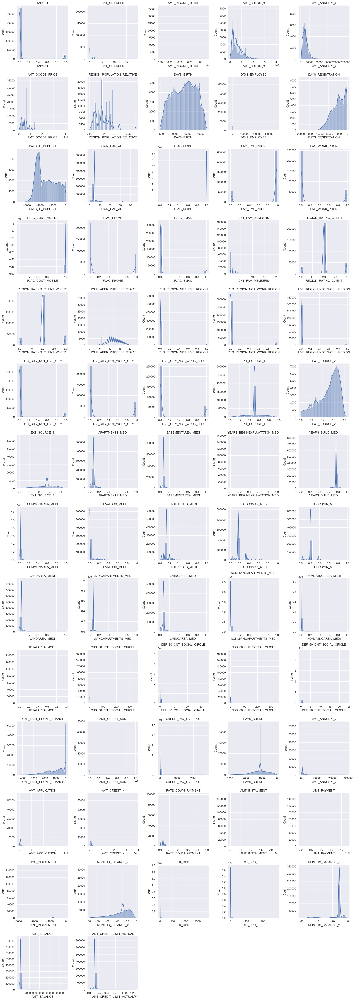

In [20]:
#univariate analysis
import math
import seaborn as sns
import matplotlib.pyplot as plt

# For inline plotting
%matplotlib inline

# Filter numeric columns
num_cols = len(data.select_dtypes(include='number').columns)
cols = 5
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(20, rows * 4))

plotnum = 1
for column in data.select_dtypes(include='number').columns:
    plt.subplot(rows, cols, plotnum)
    sns.histplot(data[column], kde=True)
    plt.title(column)
    plotnum += 1

plt.tight_layout()
plt.show()


## 📊 Univariate Analysis Report (Histograms)

This report summarizes the shape and distribution of features based on the univariate histograms generated from the dataset. It helps identify skewness, outliers, and preprocessing needs before predictive modeling.

---

### ✅ 1. Overall Observations
- Most numerical features show **right-skewed** distributions.
- There are **heavy tails and outliers** in several columns.
- Some numerical columns behave like **categorical variables** (binary flags).
- A few features are already well-scaled and have Gaussian shapes.

---

### 🔹 2. Numerical Features – Shape & Skewness

| Feature Category | Shape / Skewness | Observations | Recommended Action |
|------------------|------------------|--------------|---------------------|
| `AMT_INCOME_TOTAL`, `AMT_CREDIT_x`, `AMT_ANNUITY_x`, `AMT_APPLICATION`, `AMT_PAYMENT`, `AMT_GOODS_PRICE` | Right-skewed | Values are clustered at the lower end, with long tails | Apply `np.log1p()` transformation |
| `SK_DPD`, `SK_DPD_DEF`, `CREDIT_DAY_OVERDUE`, `OBS_*/DEF_*_CNT_SOCIAL_CIRCLE` | Highly skewed, extreme outliers | Significant presence of outliers | Use IQR method or `RobustScaler()` |
| `DAYS_BIRTH`, `DAYS_EMPLOYED`, `DAYS_REGISTRATION`, `DAYS_ID_PUBLISH` | Left-skewed or bimodal | Negative day counts (date deltas) | Convert to positive values or normalize |
| `EXT_SOURCE_1`, `EXT_SOURCE_2`, `EXT_SOURCE_3` | Approximately normal | Good distribution | Use as-is or standardize |
| `CNT_CHILDREN`, `CNT_FAM_MEMBERS` | Discrete / Categorical-like | Small range of integers | Consider treating as categorical |
| `REGION_RATING_CLIENT`, `FLAG_OWN_CAR`, `FLAG_PHONE`, etc. | Binary / Encoded Categorical | Represent true/false or levels | Convert to categorical type |

---

### 🔸 3. Recommendations
- 🔄 Apply **log transformations** to reduce skewness on monetary columns.
- ⚖️ Use **RobustScaler** or remove outliers on features with extreme values.
- 🔁 Convert binary/numeric-encoded features (e.g., `FLAG_PHONE`) to `category` type.
- 📦 Group rare values in categorical columns if applicable.
- 🔍 Recheck **feature importance** after scaling and cleaning before modeling.

---



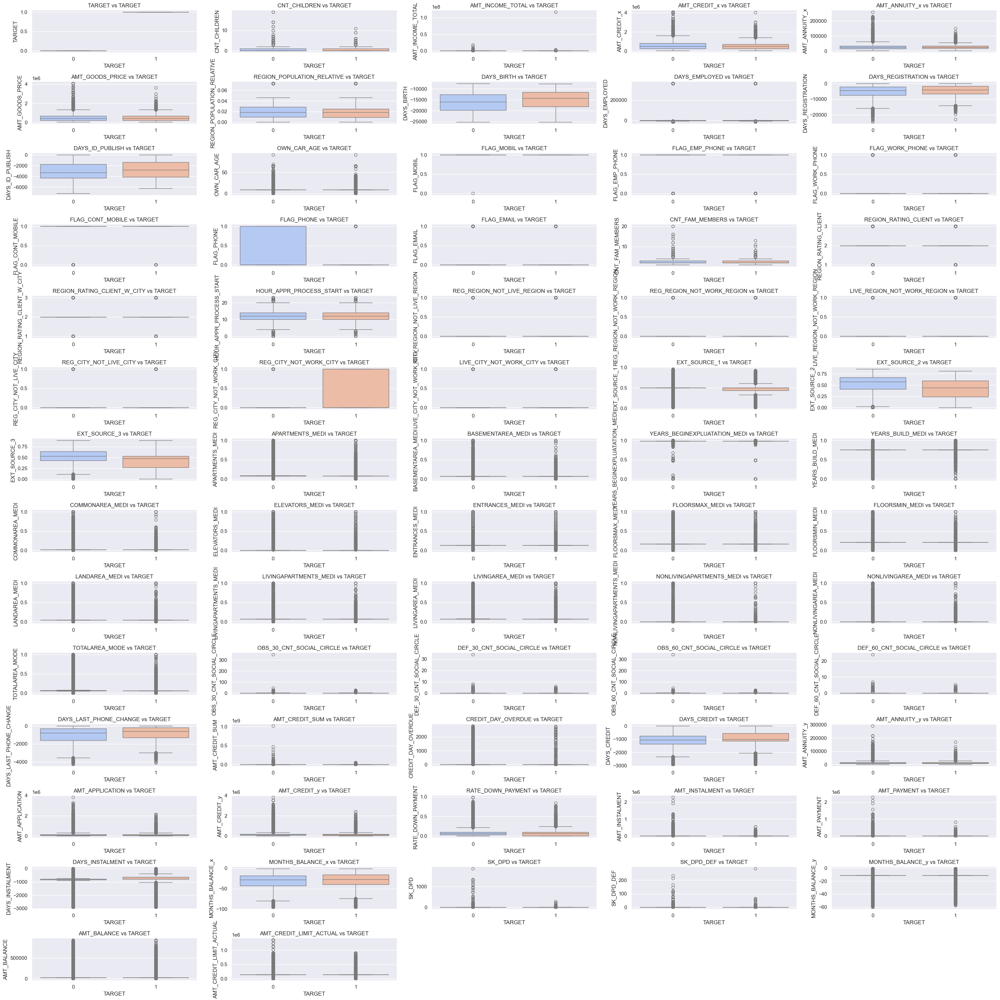

In [21]:
#Bivariate analysis
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

#Analyzing numerical data with target
plt.figure(figsize=(30, 30))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) // 5) + 1, 5, i)
    sns.boxplot(x=data['TARGET'], y=data[col], palette="coolwarm")
    plt.title(f"{col} vs TARGET")
plt.tight_layout()
plt.show()

### 📊 Boxplot Analysis: Features vs Target Variable

The following analysis summarizes the distribution of numeric features with respect to the binary `TARGET` variable:

#### ✅ Key Insights from the Boxplots

1. **Highly Discriminative Features:**
   - `EXT_SOURCE_1`, `EXT_SOURCE_2`, and `EXT_SOURCE_3` show clear separation between TARGET=0 and TARGET=1.
     - Individuals with lower EXT_SOURCE values are more likely to default (TARGET = 1).
   - `DAYS_BIRTH`: Younger individuals (larger negative values) are more likely to default.
   - `DAYS_EMPLOYED`: Very large values (possibly outliers or anomalies) are associated with non-defaulting loans (TARGET = 0).
   - `AMT_INCOME_TOTAL` and `AMT_CREDIT_x`: Median values differ across classes, but with overlapping distributions.

2. **Moderately Discriminative Features:**
   - `OWN_CAR_AGE`, `REGION_POPULATION_RELATIVE`, and `DAYS_REGISTRATION` show some separation in medians.
   - `AMT_ANNUITY_x`, `AMT_GOODS_PRICE`, and `CNT_CHILDREN`: Slight differences, not strong predictors alone.

3. **Less Impactful or Noisy Features:**
   - Many features like `NONLIVINGAPARTMENTS_MEDI`, `ELEVATORS_MEDI`, `FLOORSMAX_MEDI`, etc., show overlapping distributions with no meaningful separation.
   - These may contribute noise and could be candidates for dimensionality reduction or exclusion after testing feature importance.

4. **Categorical Encoded Features (e.g., `FLAG_OWN_CAR`, `FLAG_PHONE`)**:
   - Distributions are very similar across both target classes, indicating limited predictive power.

#### 🛠️ Recommendations

- Prioritize `EXT_SOURCE` features and `DAYS_BIRTH` in model training.
- Investigate and treat anomalies in `DAYS_EMPLOYED` (e.g., large placeholder values like 365243).
- Perform feature selection to remove noisy or low-importance variables.
- Consider transforming skewed distributions to improve model fit.



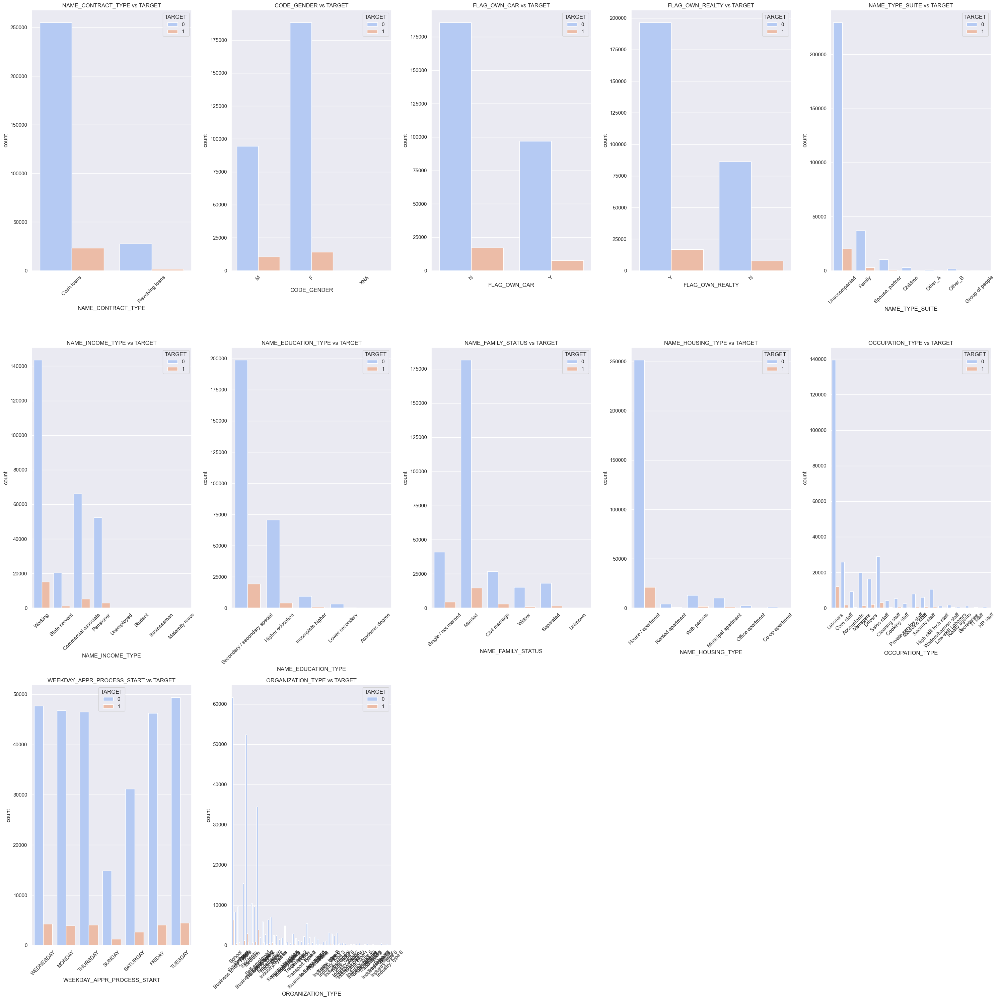

In [22]:
#Analyzing Categorical data with target
plt.figure(figsize=(30, 30))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot((len(categorical_cols) // 5) + 1, 5, i)
    sns.countplot(x=data[col], hue=data['TARGET'], palette="coolwarm")
    plt.title(f"{col} vs TARGET")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 📊 Categorical Feature Distribution vs Target (`TARGET`)

This analysis explores how different categorical variables are distributed across the two target classes: `TARGET = 0` (non-default) and `TARGET = 1` (default).

#### ✅ Key Observations:

1. **NAME_CONTRACT_TYPE**:
   - Majority of loans are `Cash loans`.
   - `Revolving loans` show a relatively higher default rate (more proportionally orange bars).

2. **CODE_GENDER**:
   - Distribution between male and female applicants is relatively balanced.
   - Slightly higher default rate among **males**.

3. **FLAG_OWN_CAR / FLAG_OWN_REALTY**:
   - People without a car or real estate show **slightly higher default** proportions.

4. **NAME_TYPE_SUITE**:
   - Most applicants are either alone or with family.
   - Applicants marked as "Unaccompanied" or with unknown type show marginally higher default.

5. **NAME_INCOME_TYPE**:
   - `Working` and `Commercial associate` form the largest groups.
   - `Unemployed`, `Maternity leave`, and `Student` have much higher default rates (though fewer in count).

6. **NAME_EDUCATION_TYPE**:
   - Lower education levels such as `Lower secondary` and `Secondary` show higher default proportions.
   - Higher education (Academic degree) has the lowest default rate.

7. **NAME_FAMILY_STATUS**:
   - `Single`, `Separated`, and `Widow` applicants show **higher default** percentages than `Married`.

8. **NAME_HOUSING_TYPE**:
   - Most applicants live in `House / apartment`, with consistent default distribution.
   - People in `Municipal apartment` show slightly higher default likelihood.

9. **OCCUPATION_TYPE**:
   - `Laborers`, `Sales staff`, and `Drivers` show higher absolute counts and noticeable default proportions.
   - `Managers` and `Core staff` have relatively better repayment (low TARGET=1).

10. **WEEKDAY_APPR_PROCESS_START**:
    - Application day of the week has minimal effect on default rates — distributions are mostly uniform.

11. **ORGANIZATION_TYPE**:
    - Some organization types (e.g., `Business Entity Type 3`, `Construction`) show **slightly higher default rates**.
    - `Self-employed`, `Government`, and `Medicine` tend to have lower default proportions.

---

#### 📌 Summary:

- Default rates tend to be **higher among applicants with lower income stability**, **lower education**, **non-married status**, and **labor-intensive jobs**.
- Some categorical features (like `Occupation`, `Education`, `Income Type`) are highly valuable for predicting credit risk.
- Consider encoding these features using One-Hot Encoding or Target Encoding, depending on model type.



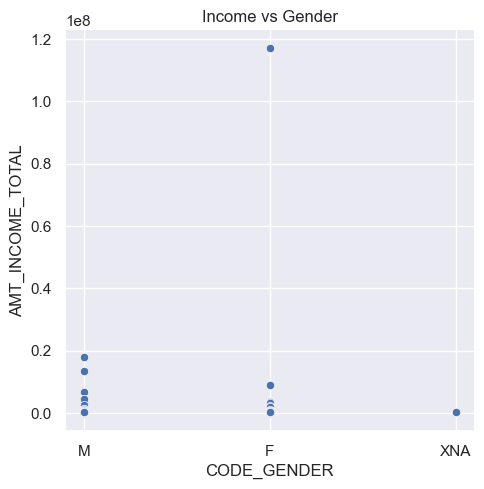

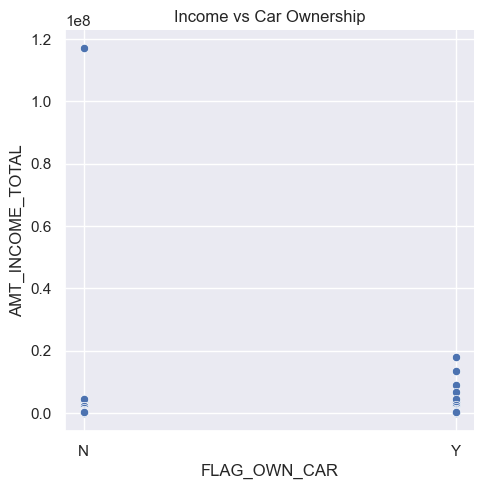

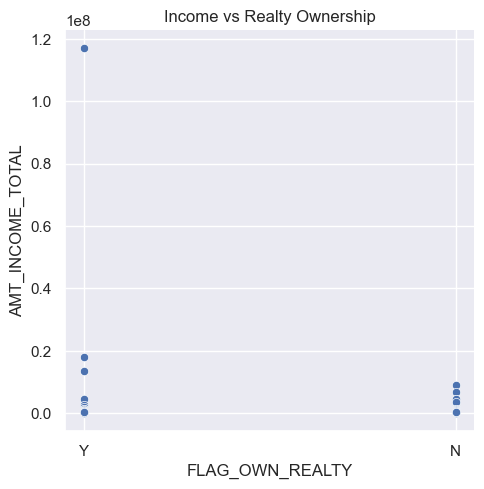

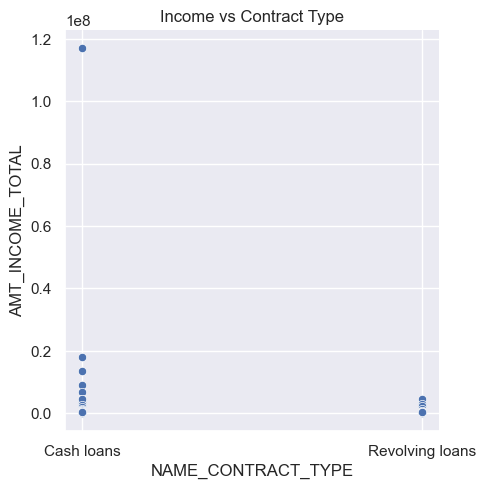

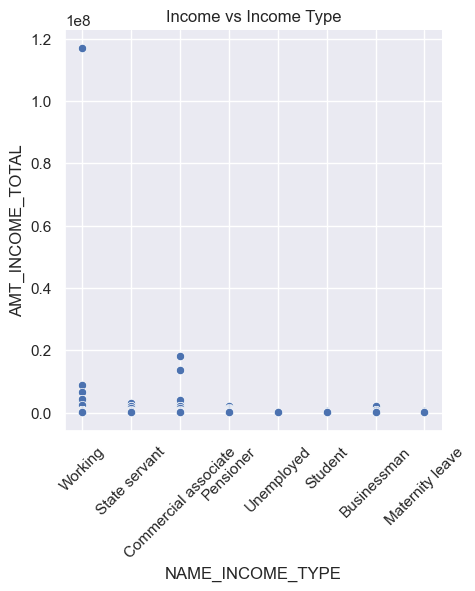

...

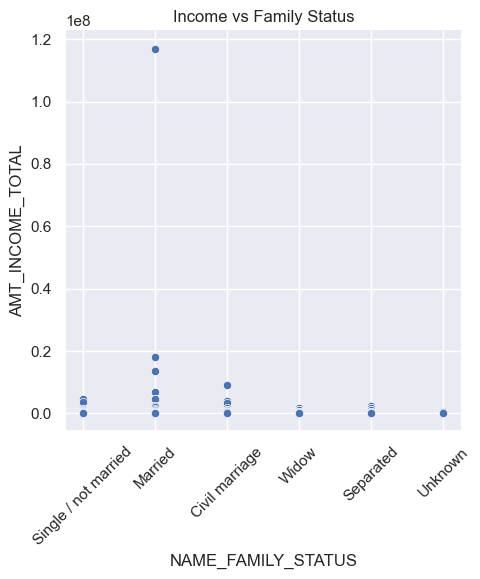

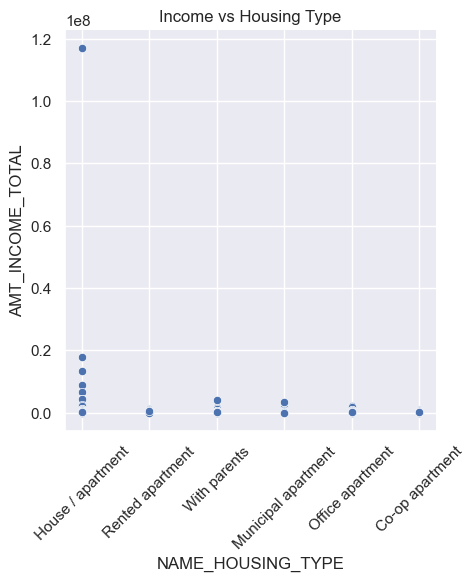

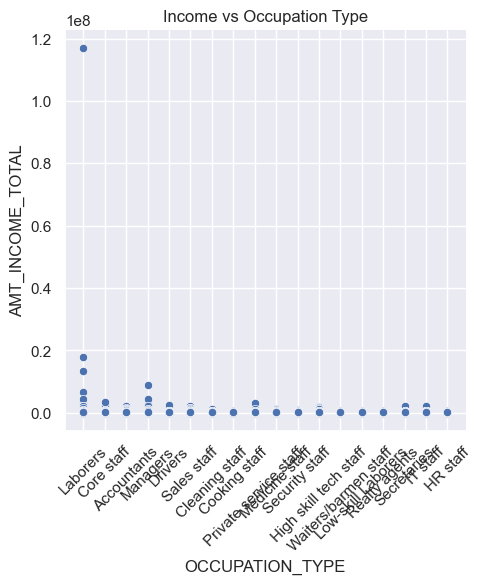

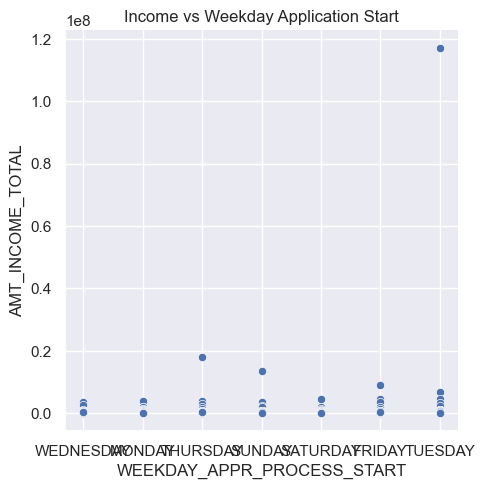

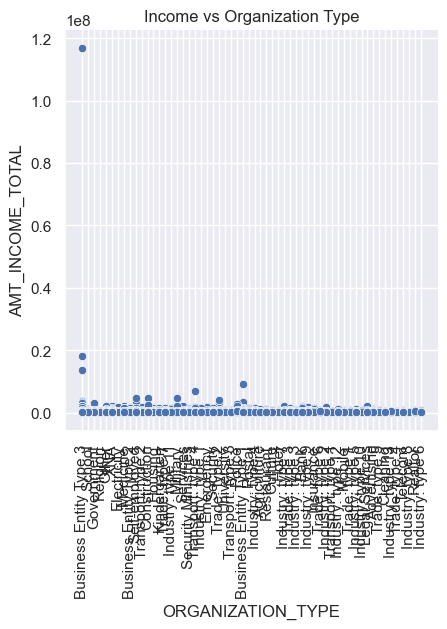

In [24]:
# ---------------------------------------------
# 🔍 Analyzing the relationships between input attributes
# ---------------------------------------------

# 1. Income distribution by gender
sns.relplot(x='CODE_GENDER', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Gender")
plt.show()

# 2. Income vs Car Ownership
sns.relplot(x='FLAG_OWN_CAR', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Car Ownership")
plt.show()

# 3. Income vs Realty Ownership
sns.relplot(x='FLAG_OWN_REALTY', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Realty Ownership")
plt.show()

# 4. Income vs Contract Type
sns.relplot(x='NAME_CONTRACT_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Contract Type")
plt.show()

# 5. Income vs Income Type
sns.relplot(x='NAME_INCOME_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Income Type")
plt.xticks(rotation=45)
plt.show()

# 6. Income vs Education Type
sns.relplot(x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Education Type")
plt.xticks(rotation=45)
plt.show()

# 7. Income vs Family Status
sns.relplot(x='NAME_FAMILY_STATUS', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Family Status")
plt.xticks(rotation=45)
plt.show()

# 8. Income vs Housing Type
sns.relplot(x='NAME_HOUSING_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Housing Type")
plt.xticks(rotation=45)
plt.show()

# 9. Income vs Occupation
sns.relplot(x='OCCUPATION_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Occupation Type")
plt.xticks(rotation=45)
plt.show()

# 10. Income vs Weekday Application Start
sns.relplot(x='WEEKDAY_APPR_PROCESS_START', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Weekday Application Start")
plt.show()

# 11. Income vs Organization Type
sns.relplot(x='ORGANIZATION_TYPE', y='AMT_INCOME_TOTAL', data=data)
plt.title("Income vs Organization Type")
plt.xticks(rotation=90)
plt.show()


### 💹 Income Distribution Analysis Across Categorical Attributes

This section visualizes how income (`AMT_INCOME_TOTAL`) varies across different categorical variables to identify potential influencing factors and outliers.

---

#### 1. **Gender (CODE_GENDER)**
- Both males (`M`) and females (`F`) show similar income ranges.
- A single outlier (likely an error) exists under `F` with extremely high income (> 100M).
- Category `XNA` is rare and may represent missing or miscoded data.

---

#### 2. **Car and Realty Ownership**
- Individuals owning a car (`Y`) or real estate (`Y`) generally exhibit similar income distributions as those who don't.
- No significant income difference based solely on asset ownership flags.

---

#### 3. **Contract Type**
- Majority of applicants fall under `Cash loans`, with a few under `Revolving loans`.
- Income range across both types is similar, except for a few high-income outliers.

---

#### 4. **Income Type**
- `Working`, `Commercial associate`, and `Pensioner` categories dominate and span a wide income range.
- Categories like `Student`, `Maternity leave`, and `Unemployed` show expectedly lower income values.
- Some high-income outliers exist, particularly in `Working` and `Pensioner`.

---

#### 5. **Education Type**
- Most applicants are `Secondary` or `Higher education` graduates.
- Lower education groups like `Lower secondary` and `Incomplete higher` show comparatively tighter and lower income distributions.
- One extreme income outlier is present in the `Higher education` group.

---

#### 6. **Family and Housing Status**
- `Married` individuals show a wider range of income.
- Other statuses like `Separated`, `Widow`, and `Civil marriage` remain relatively consistent but with fewer high-income entries.
- No strong variation in income based on `NAME_HOUSING_TYPE`.

---

#### 7. **Occupation Type**
- `Laborers`, `Sales staff`, and `Core staff` dominate the data volume.
- Income levels are relatively low for most occupational categories, with few noticeable outliers.
- `Managers` and `High skill tech staff` tend to have higher average income, as expected.

---

#### 8. **Application Weekday & Organization Type**
- No significant trend in income based on the day of application (`WEEKDAY_APPR_PROCESS_START`).
- Some organizational categories show outliers, but most have a similar spread with tightly packed low-income bands.
- Suggests `ORGANIZATION_TYPE` alone is not a strong predictor of income unless combined with other variables.

---

### 📌 Overall Observations
- Outliers are present in many categories and should be handled (e.g., capping or log transformation).
- `Income Type`, `Education Type`, and `Occupation Type` provide meaningful insights into income variation.
- Several variables (e.g., `WEEKDAY_APPR_PROCESS_START`, `FLAG_OWN_CAR`) do not significantly affect income independently.



### DATA PREPROCESSING

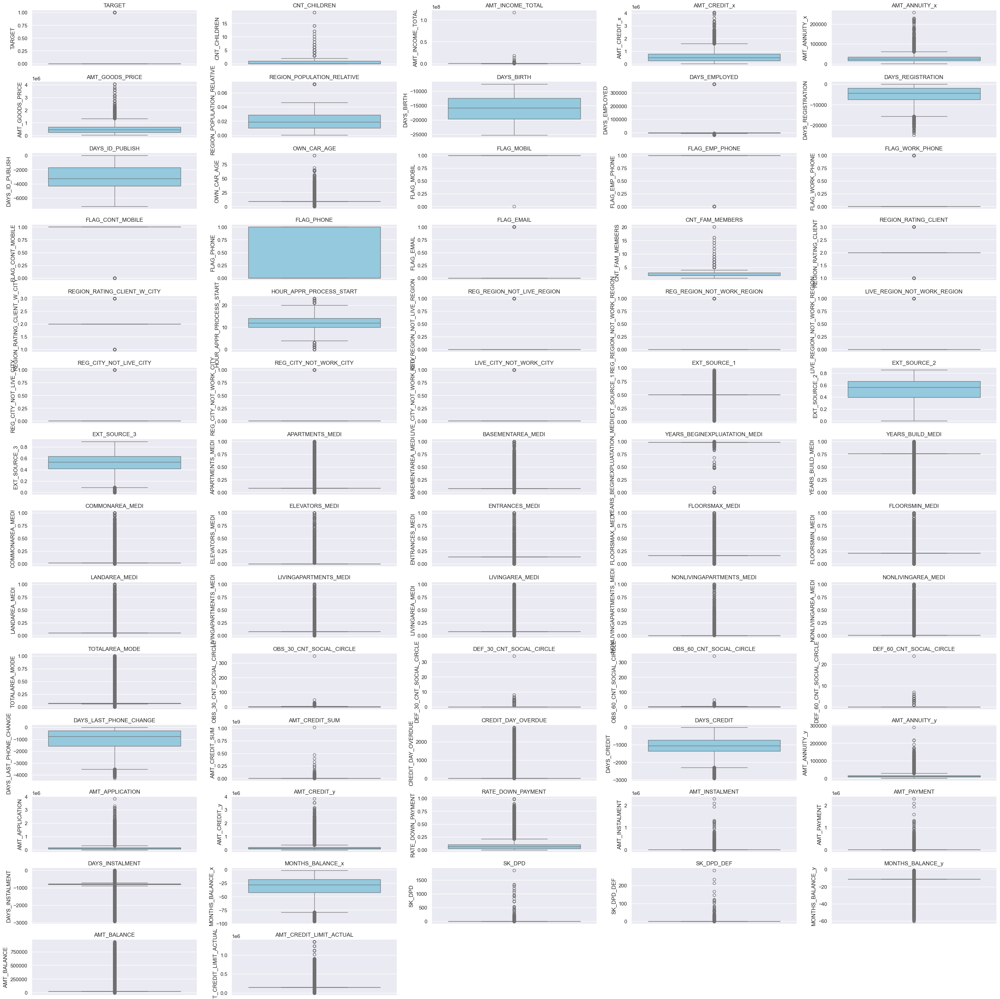

In [23]:
#Finding Outliers
plt.figure(figsize=(30, 30))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) // 5) + 1, 5, i)
    sns.boxplot(y=data[col], color="skyblue")
    plt.title(col)
plt.tight_layout()
plt.show()

In [25]:
from scipy.stats import zscore

# Select numerical columns (excluding TARGET)
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_cols.remove('TARGET')  # Exclude target variable

# Function to count outliers using Z-score method
def count_outliers_zscore(df, columns, threshold=3):
    outlier_dict = {}
    for col in columns:
        z_scores = zscore(df[col])  # Compute Z-scores
        outliers = df[(abs(z_scores) > threshold)]  # Count values > threshold
        outlier_dict[col] = len(outliers)
    return outlier_dict

# Count outliers in each numerical column (excluding TARGET)
outliers_found = count_outliers_zscore(data, numerical_cols)

# Print count of outliers per column
print("Outlier Count Per Column (Excluding TARGET):")
print(outliers_found)


Outlier Count Per Column (Excluding TARGET):
{'CNT_CHILDREN': 4272, 'AMT_INCOME_TOTAL': 454, 'AMT_CREDIT_x': 3255, 'AMT_ANNUITY_x': 2959, 'AMT_GOODS_PRICE': 4173, 'REGION_POPULATION_RELATIVE': 8412, 'DAYS_BIRTH': 0, 'DAYS_EMPLOYED': 0, 'DAYS_REGISTRATION': 749, 'DAYS_ID_PUBLISH': 0, 'OWN_CAR_AGE': 4665, 'FLAG_MOBIL': 1, 'FLAG_EMP_PHONE': 0, 'FLAG_WORK_PHONE': 0, 'FLAG_CONT_MOBILE': 574, 'FLAG_PHONE': 0, 'FLAG_EMAIL': 17442, 'CNT_FAM_MEMBERS': 4007, 'REGION_RATING_CLIENT': 0, 'REGION_RATING_CLIENT_W_CITY': 0, 'HOUR_APPR_PROCESS_START': 622, 'REG_REGION_NOT_LIVE_REGION': 4657, 'REG_REGION_NOT_WORK_REGION': 15612, 'LIVE_REGION_NOT_WORK_REGION': 12503, 'REG_CITY_NOT_LIVE_CITY': 24039, 'REG_CITY_NOT_WORK_CITY': 0, 'LIVE_CITY_NOT_WORK_CITY': 0, 'EXT_SOURCE_1': 1593, 'EXT_SOURCE_2': 0, 'EXT_SOURCE_3': 0, 'APARTMENTS_MEDI': 7028, 'BASEMENTAREA_MEDI': 5251, 'YEARS_BEGINEXPLUATATION_MEDI': 656, 'YEARS_BUILD_MEDI': 8487, 'COMMONAREA_MEDI': 4803, 'ELEVATORS_MEDI': 7446, 'ENTRANCES_MEDI': 4956, 'FL

In [26]:
def remove_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

iqr_cols = ['CNT_CHILDREN', 'OWN_CAR_AGE', 'REGION_POPULATION_RELATIVE',
            'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
            'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
            'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
            'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

# Remove extreme outliers
data_cleaned = remove_outliers_iqr(data, iqr_cols)
print("Dataset shape after IQR outlier removal:", data_cleaned.shape)

Dataset shape after IQR outlier removal: (129391, 79)


In [32]:
from scipy.stats.mstats import winsorize

winsorize_cols = [
    'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
    'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
    'DAYS_ID_PUBLISH', 'REGION_POPULATION_RELATIVE', 'OWN_CAR_AGE',
    'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE', 'OBS_30_CNT_SOCIAL_CIRCLE',
    'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE'
]

# Keep only valid columns
winsorize_cols = [col for col in winsorize_cols if col in data_cleaned.columns]

# Apply winsorization
for col in winsorize_cols:
    data_cleaned[col] = winsorize(data_cleaned[col], limits=(0.05, 0.05))


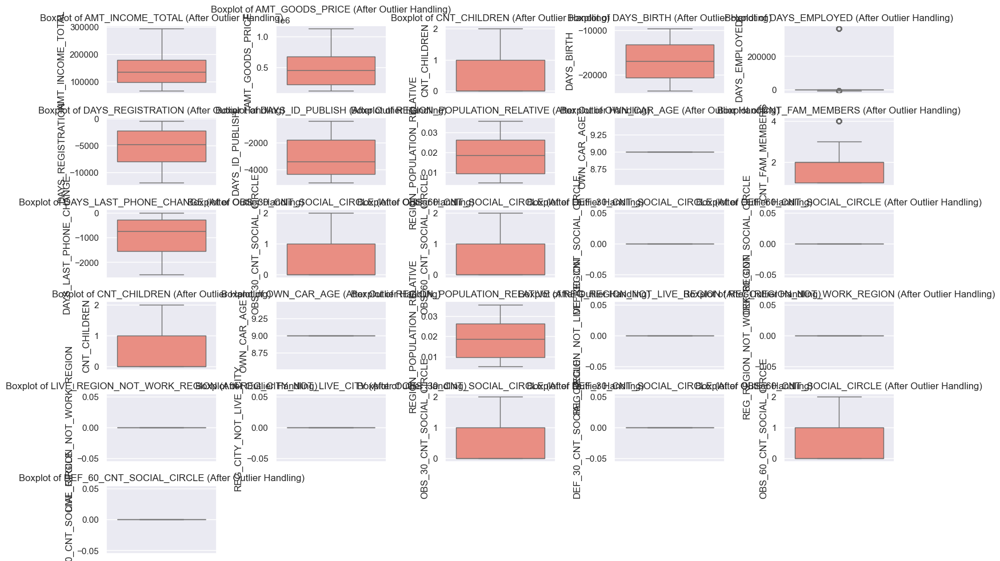

In [33]:
#checking the count whether handled or not
plt.figure(figsize=(15, 10))
for i, col in enumerate(winsorize_cols + iqr_cols, 1):
    plt.subplot((len(winsorize_cols + iqr_cols) // 5) + 1, 5, i)
    sns.boxplot(y=data_cleaned[col], color="salmon")
    plt.title(f"Boxplot of {col} (After Outlier Handling)")
plt.tight_layout()
plt.show()


In [34]:
from scipy.stats import zscore
def count_outliers_zscore(df, columns, threshold=3):
    outlier_dict = {}
    for col in columns:
        z_scores = zscore(df[col])  # Compute Z-scores
        outliers = df[(abs(z_scores) > threshold)]  # Count values > threshold
        outlier_dict[col] = len(outliers)
    return outlier_dict

# Count outliers in cleaned data
outliers_after = count_outliers_zscore(data_cleaned, winsorize_cols + iqr_cols)
print("Outlier Count After Handling:", outliers_after)

Outlier Count After Handling: {'AMT_INCOME_TOTAL': 0, 'AMT_GOODS_PRICE': 0, 'CNT_CHILDREN': 0, 'DAYS_BIRTH': 0, 'DAYS_EMPLOYED': 0, 'DAYS_REGISTRATION': 0, 'DAYS_ID_PUBLISH': 0, 'REGION_POPULATION_RELATIVE': 0, 'OWN_CAR_AGE': 0, 'CNT_FAM_MEMBERS': 0, 'DAYS_LAST_PHONE_CHANGE': 0, 'OBS_30_CNT_SOCIAL_CIRCLE': 0, 'OBS_60_CNT_SOCIAL_CIRCLE': 0, 'DEF_30_CNT_SOCIAL_CIRCLE': 0, 'DEF_60_CNT_SOCIAL_CIRCLE': 0, 'REG_REGION_NOT_LIVE_REGION': 0, 'REG_REGION_NOT_WORK_REGION': 0, 'LIVE_REGION_NOT_WORK_REGION': 0, 'REG_CITY_NOT_LIVE_CITY': 0}


## Feature Engineering

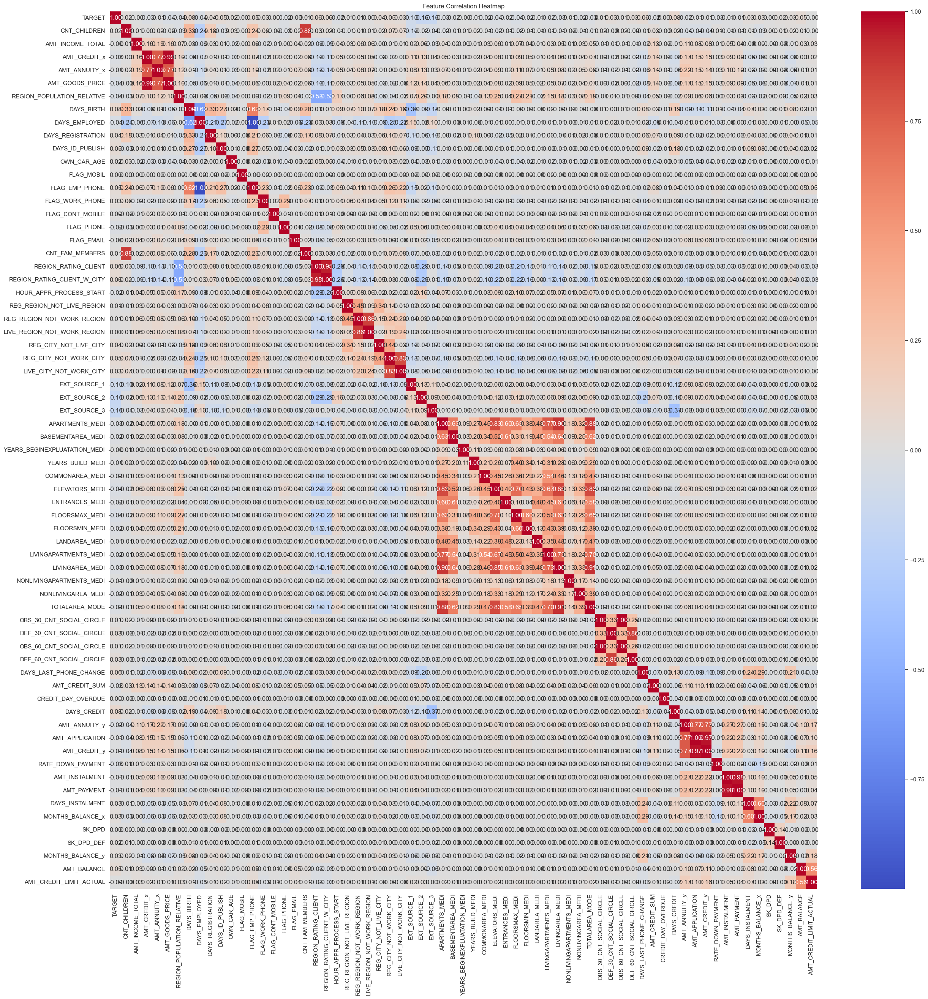

In [35]:
# Select only numerical columns
numerical_data = data.select_dtypes(include=['int64', 'float64'])  # This is a DataFrame

# Calculate the correlation matrix
corr_matrix = numerical_data.corr()  # Apply .corr() to the DataFrame, not a list
# Plot the heatmap
plt.figure(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
# Set title
plt.title("Feature Correlation Heatmap")
plt.show()

In [36]:
#Find Correlations with the Target
target_corr = corr_matrix['TARGET'].sort_values(ascending=False)
print("Correlations with target variable 'target':")
print(target_corr)

Correlations with target variable 'target':
TARGET                         1.000000
DAYS_CREDIT                    0.082079
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
                                 ...   
AMT_GOODS_PRICE               -0.039623
DAYS_EMPLOYED                 -0.044932
EXT_SOURCE_1                  -0.098887
EXT_SOURCE_3                  -0.155892
EXT_SOURCE_2                  -0.160295
Name: TARGET, Length: 67, dtype: float64


In [37]:
# Expand display settings to show all columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Find correlations with 'TARGET'
target_corr = corr_matrix['TARGET'].sort_values(ascending=False)

# Print full correlation list
print("Correlations with target variable 'TARGET':")
print(target_corr)

Correlations with target variable 'TARGET':
TARGET                          1.000000
DAYS_CREDIT                     0.082079
DAYS_BIRTH                      0.078239
REGION_RATING_CLIENT_W_CITY     0.060893
REGION_RATING_CLIENT            0.058899
DAYS_LAST_PHONE_CHANGE          0.055218
DAYS_ID_PUBLISH                 0.051457
REG_CITY_NOT_WORK_CITY          0.050994
AMT_BALANCE                     0.049171
FLAG_EMP_PHONE                  0.045982
REG_CITY_NOT_LIVE_CITY          0.044395
DAYS_REGISTRATION               0.041975
LIVE_CITY_NOT_WORK_CITY         0.032518
DEF_30_CNT_SOCIAL_CIRCLE        0.032394
DEF_60_CNT_SOCIAL_CIRCLE        0.031401
MONTHS_BALANCE_x                0.029863
FLAG_WORK_PHONE                 0.028524
DAYS_INSTALMENT                 0.028387
MONTHS_BALANCE_y                0.026268
CNT_CHILDREN                    0.019187
SK_DPD_DEF                      0.016495
OWN_CAR_AGE                     0.015982
OBS_30_CNT_SOCIAL_CIRCLE        0.009447
OBS_60_CNT_SO

In [38]:
# Find pairs with correlation > 0.8
high_corr = corr_matrix.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr >= 0.8]  # Threshold for strong correlation
print("Highly correlated feature pairs:")
print(high_corr)

Highly correlated feature pairs:
TARGET                        TARGET                          1.000000
YEARS_BUILD_MEDI              YEARS_BUILD_MEDI                1.000000
APARTMENTS_MEDI               APARTMENTS_MEDI                 1.000000
EXT_SOURCE_3                  EXT_SOURCE_3                    1.000000
EXT_SOURCE_2                  EXT_SOURCE_2                    1.000000
EXT_SOURCE_1                  EXT_SOURCE_1                    1.000000
LIVE_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY         1.000000
REG_CITY_NOT_WORK_CITY        REG_CITY_NOT_WORK_CITY          1.000000
REG_CITY_NOT_LIVE_CITY        REG_CITY_NOT_LIVE_CITY          1.000000
LIVE_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION     1.000000
REG_REGION_NOT_WORK_REGION    REG_REGION_NOT_WORK_REGION      1.000000
REG_REGION_NOT_LIVE_REGION    REG_REGION_NOT_LIVE_REGION      1.000000
HOUR_APPR_PROCESS_START       HOUR_APPR_PROCESS_START         1.000000
REGION_RATING_CLIENT_W_CITY   REGION_RATING_

In [39]:
#removing highly correlated variables (dropping them)
columns_to_drop = [
    'AMT_GOODS_PRICE', 'REGION_RATING_CLIENT', 'TOTALAREA_MODE',
    'APARTMENTS_MEDI', 'CNT_CHILDREN', 'DEF_60_CNT_SOCIAL_CIRCLE'
]
data = data.drop(columns=columns_to_drop)
print("Dataset shape after removing highly correlated features:", data.shape)

Dataset shape after removing highly correlated features: (307511, 73)


In [40]:
# Checking categorical cols for applying encoding
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
print("Categorical Columns:", categorical_cols)

Categorical Columns: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']


In [41]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
import pickle
from sklearn.pipeline import Pipeline

In [42]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

In [43]:
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(numerical_cols)

['TARGET', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_CREDIT_SUM', 'CREDIT_DAY_OVERDUE', '

In [44]:
#The columns are given to the encoders and scalers accordingly
standard_scaler = ['REGION_POPULATION_RELATIVE', 'HOUR_APPR_PROCESS_START']
minmax_scaler = ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'AMT_CREDIT_SUM', 'AMT_BALANCE',
    'AMT_CREDIT_y', 'AMT_PAYMENT', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
    'DAYS_ID_PUBLISH', 'DAYS_CREDIT', 'DAYS_LAST_PHONE_CHANGE', 'DAYS_ENTRY_PAYMENT',
    'CNT_FAM_MEMBERS', 'CNT_INSTALMENT_FUTURE', 'OBS_30_CNT_SOCIAL_CIRCLE',
    'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'CREDIT_DAY_OVERDUE',
    'SK_DPD_x', 'SK_DPD_y']
frequency_encoder = ['ORGANIZATION_TYPE']
ordinal_encoder = ['NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START',
                  'NAME_CONTRACT_STATUS','OCCUPATION_TYPE']
target_encoder = ['OCCUPATION_TYPE']
label_encoder = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']
passthrough = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',  # Already normalized features
    'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',  # Binary features
    'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
               'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',  # Binary region indicators
    'NAME_CONTRACT_STATUS' ] # Categorical (already encoded)

In [45]:
#code to do label encoding
class ModifiedLabelEncoder(LabelEncoder):
    def fit_transform(self, y, *args, **kwargs):
        return super().fit_transform(y).reshape(-1, 1)
    def transform(self, y, *args, **kwargs):
        return super().transform(y).reshape(-1, 1)

In [46]:
#code to do frequency encoding
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.mapping = {}
    def fit(self, X, y=None):
        # Calculate frequency encoding mapping for the column
        value_counts = X[self.column].value_counts()
        sorted_values = sorted(value_counts.items(), key=lambda x: x[1])
        self.mapping = {value: idx for idx, (value, _) in enumerate(sorted_values)}
        return self
    def transform(self, X):
        # Apply frequency encoding based on the fitted mapping
        X_encoded = X.copy()
        X_encoded[self.column] = X_encoded[self.column].map(self.mapping)
        return X_encoded

In [47]:
from category_encoders import TargetEncoder
class CustomTargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.encoder = TargetEncoder()
    def fit(self, X, y):
        self.encoder.fit(X[[self.column]], y)  # Fit on the categorical column and target variable
        return self
    def transform(self, X):
        X_encoded = X.copy()
        X_encoded[self.column] = self.encoder.transform(X_encoded[[self.column]]).squeeze()  # Apply encoding
        return X_encoded

In [48]:
#code for Ordinal Encoder
from sklearn.preprocessing import OrdinalEncoder
class CustomOrdinalEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column, categories):
        self.column = column
        self.categories = categories  # Define the specific order
        self.encoder = OrdinalEncoder(categories=[categories], handle_unknown="use_encoded_value", unknown_value=-1)
    def fit(self, X, y=None):
        self.encoder.fit(X[[self.column]])  # Fit on the specified column
        return self
    def transform(self, X):
        X_encoded = X.copy()
        X_encoded[self.column] = self.encoder.transform(X_encoded[[self.column]]).astype(int)  # Apply encoding
        return X_encoded

In [49]:
ordinal_mappings = {
    'NAME_TYPE_SUITE': ['Unaccompanied', 'Family', 'Spouse, partner', 'Children', 'Other_A', 'Other_B', 'Group of people'],
    'NAME_INCOME_TYPE': ['Student', 'Pensioner', 'Unemployed', 'Working', 'Commercial associate', 'State servant', 'Businessman', 'Maternity leave'],
    'NAME_EDUCATION_TYPE': ['Lower secondary', 'Secondary / secondary special', 'Incomplete higher', 'Higher education', 'Academic degree'],
    'NAME_FAMILY_STATUS': ['Single / not married', 'Separated', 'Widow', 'Civil marriage', 'Married'],
    'NAME_HOUSING_TYPE': ['Rented apartment', 'With parents', 'Municipal apartment', 'Office apartment', 'Co-op apartment', 'House / apartment'],
    'WEEKDAY_APPR_PROCESS_START': ['MONDAY', 'TUESDAY', 'WEDNESDAY', 'THURSDAY', 'FRIDAY', 'SATURDAY', 'SUNDAY'],
    'NAME_CONTRACT_STATUS': ['Approved', 'Unused offer', 'Canceled', 'Refused']
}

In [50]:
def same(x):
    return x

In [51]:
no_trans=FunctionTransformer(same)

In [52]:
from category_encoders import TargetEncoder
target_encoder = TargetEncoder()
data['OCCUPATION_TYPE'] = target_encoder.fit_transform(data['OCCUPATION_TYPE'], data['TARGET'])  # Fit with y

In [55]:
valid_cols = data.columns.tolist()

# Now filter each transformer’s column list
standard_scaler   = [col for col in standard_scaler if col in valid_cols]
minmax_scaler     = [col for col in minmax_scaler if col in valid_cols]
ordinal_encoder   = [col for col in ordinal_encoder if col in valid_cols]
label_encoder     = [col for col in label_encoder if col in valid_cols]
frequency_encoder = [col for col in frequency_encoder if col in valid_cols]
passthrough       = [col for col in passthrough if col in valid_cols]


In [56]:
# Define the column transformer with all encoders and scalers
preprocessor = ColumnTransformer([
    ("Standard_scaler", StandardScaler(), standard_scaler), 
    ("MinMax_scaler",MinMaxScaler(),minmax_scaler),
    ("Ordinal_encoder", OrdinalEncoder(), ordinal_encoder),  # Ordinal Encoding
    ("Label_encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), label_encoder),  # Label Encoding
    ("Frequency_encoder", FrequencyEncoder(column="ORGANIZATION_TYPE"), ['ORGANIZATION_TYPE']),  # Frequency Encoding
    ("Pass_through",no_trans,passthrough)  # Keep these columns unchanged
])

In [57]:
# Fit and transform the data
transformed_data = preprocessor.fit_transform(data)
# Print transformed data
print("Transformed data shape:", transformed_data.shape)
print("Preview of transformed data:")
print(transformed_data[:5])

Transformed data shape: (307511, 46)
Preview of transformed data:
[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03  9.02865169e-02
   8.49795016e-04  2.91211305e-02  4.68117647e-02  5.04475485e-03
   8.88838782e-01  4.50861923e-02  8.52140078e-01  7.05432819e-01
   7.00889802e-01  7.35787512e-01  0.00000000e+00  5.74712644e-03
   5.88235294e-02  5.81395349e-03  0.00000000e+00  6.00000000e+00
   7.00000000e+00  4.00000000e+00  3.00000000e+00  1.00000000e+00
   6.00000000e+00  1.00000000e+01  0.00000000e+00  1.00000000e+00
   0.00000000e+00  1.00000000e+00  5.70000000e+01  8.30369674e-02
   2.62948593e-01  1.39375780e-01  1.00000000e+00  1.00000000e+00
   0.00000000e+00  1.00000000e+00  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03  3.11735955e-01
   9.99452416e-04  2.91211305e-02  2.70818824e-01  2.82606690e-02
   4.77113867e-01  4.36481320e-02  9.5192

In [58]:
preprocessor

ColumnTransformer(transformers=[('Standard_scaler', StandardScaler(),
                                 ['REGION_POPULATION_RELATIVE',
                                  'HOUR_APPR_PROCESS_START']),
                                ('MinMax_scaler', MinMaxScaler(),
                                 ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x',
                                  'AMT_CREDIT_SUM', 'AMT_BALANCE',
                                  'AMT_CREDIT_y', 'AMT_PAYMENT', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'DAYS_CREDIT',
                                  'DAYS_LAST_PHONE...
                                 FunctionTransformer(func=<function same at 0x0000019886DF4040>),
                                 ['EXT_SOURCE_1', 'EXT_SOURCE_2',
                                  'EXT_SOURCE_3', 'FLAG_MOBIL',
                                  'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
                                  'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                                  'FLAG_EMAIL', 'REG_REGION_NOT_LIVE_REGION',
                                  'REG_REGION_NOT_WORK_REGION',
                                  'LIVE_REGION_NOT_WORK_REGION',
                                  'REG_CITY_NOT_LIVE_CITY',
                                  'REG_CITY_NOT_WORK_CITY',
                                  'LIVE_CITY_NOT_WORK_CITY'])])

In [59]:
# Fit and transform the data using the preprocessor
transformed_data = preprocessor.fit_transform(data)
# Print the transformed data
print(transformed_data)

[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-7.83450959e-01 -9.38022412e-01  3.57770742e-04 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [-1.14711999e+00 -9.38022412e-01  1.08870022e-03 ...  0.00000000e+00
   1.00000000e+00  1.00000000e+00]
 [-1.12463468e+00 -9.38022412e-01  1.24258010e-03 ...  1.00000000e+00
   1.00000000e+00  0.00000000e+00]
 [ 1.83294163e+00  2.43019035e+00  1.12717019e-03 ...  0.00000000e+00
   1.00000000e+00  1.00000000e+00]]


In [60]:
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Columns: {columns}")

Transformer: Standard_scaler, Columns: ['REGION_POPULATION_RELATIVE', 'HOUR_APPR_PROCESS_START']
Transformer: MinMax_scaler, Columns: ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_CREDIT_SUM', 'AMT_BALANCE', 'AMT_CREDIT_y', 'AMT_PAYMENT', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_CREDIT', 'DAYS_LAST_PHONE_CHANGE', 'CNT_FAM_MEMBERS', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'CREDIT_DAY_OVERDUE']
Transformer: Ordinal_encoder, Columns: ['NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'OCCUPATION_TYPE']
Transformer: Label_encoder, Columns: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']
Transformer: Frequency_encoder, Columns: ['ORGANIZATION_TYPE']
Transformer: Pass_through, Columns: ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG

In [61]:
# Print a preview of the transformed data
print("Preview of transformed data:")
print(transformed_data[:5])  # Show first 5 rows
# Check data type of transformed_data
if isinstance(transformed_data, np.ndarray):
    print("Data is encoded: Transformed data is a NumPy array.")
else:
    print("Data is not properly encoded.")
# Verify specific transformations
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Applied on Columns: {columns}")

Preview of transformed data:
[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03  9.02865169e-02
   8.49795016e-04  2.91211305e-02  4.68117647e-02  5.04475485e-03
   8.88838782e-01  4.50861923e-02  8.52140078e-01  7.05432819e-01
   7.00889802e-01  7.35787512e-01  0.00000000e+00  5.74712644e-03
   5.88235294e-02  5.81395349e-03  0.00000000e+00  6.00000000e+00
   7.00000000e+00  4.00000000e+00  3.00000000e+00  1.00000000e+00
   6.00000000e+00  1.00000000e+01  0.00000000e+00  1.00000000e+00
   0.00000000e+00  1.00000000e+00  5.70000000e+01  8.30369674e-02
   2.62948593e-01  1.39375780e-01  1.00000000e+00  1.00000000e+00
   0.00000000e+00  1.00000000e+00  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03  3.11735955e-01
   9.99452416e-04  2.91211305e-02  2.70818824e-01  2.82606690e-02
   4.77113867e-01  4.36481320e-02  9.51929313e-01  9.59566486e-01
   5.2061943

In [63]:
import pickle   # For saving and loading machine learning models
from sklearn.model_selection import train_test_split  # For splitting the data into training and testing
from imblearn.over_sampling import SMOTE  # For balancing the data
import warnings

# Task 2:-Create a predictive model  to  identify the factors / customer segments that are eligible for taking loan.

In [64]:
# Final feature set
X = data.drop('TARGET', axis=1)  # Features
y = data['TARGET']  # Target

In [65]:
# Spliting the data into train and test
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=33)

In [66]:
print(x_train.columns)

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'BASEMENTAREA_MEDI',
       'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',


In [67]:
# Transform the training data using the preprocessor object or PipeLine
processed_x_train = preprocessor.fit_transform(x_train)
processed_x_test = preprocessor.fit_transform(x_test)

In [70]:
from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight(class_weight={0:1,1:5},y=y_train)  

In [71]:
import time
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_sample_weight

### 1.Logistic Regression

In [72]:
from sklearn.model_selection import GridSearchCV
log_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']  # Optimization algorithms
}
log_grid = GridSearchCV(LogisticRegression(class_weight='balanced', random_state=42), 
                        log_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
log_grid.fit(processed_x_train, y_train)
print("Best Parameters for Logistic Regression:", log_grid.best_params_)
# Train final Logistic Regression model
best_log_model = LogisticRegression(**log_grid.best_params_, class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters for Logistic Regression: {'C': 10, 'solver': 'liblinear'}


LogisticRegression(C=10, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [73]:
# Train Logistic Regression with Best Parameters
best_log_model = LogisticRegression(C=1, solver='liblinear', class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

LogisticRegression(C=1, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [74]:
y_predict = best_log_model.predict(processed_x_test)

In [75]:
y_predict

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

 Logistic Regression Accuracy: 0.6844480865787351

 Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     70614
           1       0.16      0.66      0.25      6264

    accuracy                           0.68     76878
   macro avg       0.56      0.67      0.53     76878
weighted avg       0.89      0.68      0.76     76878



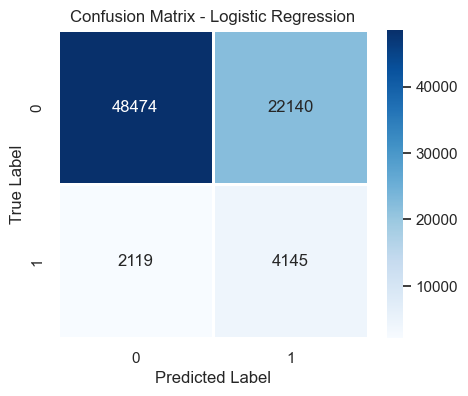

In [78]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
log_accuracy = accuracy_score(y_test, y_predict)
print(" Logistic Regression Accuracy:", log_accuracy)
print("\n Classification Report for Logistic Regression:")
print(classification_report(y_test, y_predict))
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

### 2.Decision Tree

In [79]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
# Define parameter grid
param_grid = {
    'max_depth': [3, 5, 10, 20],  # Control depth to avoid overfitting
    'min_samples_split': [10, 20, 50],  # Minimum samples to split a node
    'min_samples_leaf': [5, 10, 20],  # Minimum samples per leaf node
    'criterion': ['gini', 'entropy']  # Try different split criteria
}
# Perform GridSearchCV
dt_grid = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, 
                       cv=5, scoring='roc_auc', n_jobs=-1, verbose=2)
# Fit model on training data
dt_grid.fit(processed_x_train, y_train)
# Best parameters
print("Best Parameters for Decision Tree:", dt_grid.best_params_)
# Train final Decision Tree with best parameters
best_dt_model = DecisionTreeClassifier(**dt_grid.best_params_, random_state=42)
best_dt_model.fit(processed_x_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters for Decision Tree: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 10}


DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5,
                       min_samples_split=10, random_state=42)

In [80]:
# Predict
y_pred_dt = best_dt_model.predict(processed_x_test)
y_pred_dt

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Decision Tree Accuracy: 0.9185202528681807

 Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70614
           1       0.00      0.00      0.00      6264

    accuracy                           0.92     76878
   macro avg       0.46      0.50      0.48     76878
weighted avg       0.84      0.92      0.88     76878



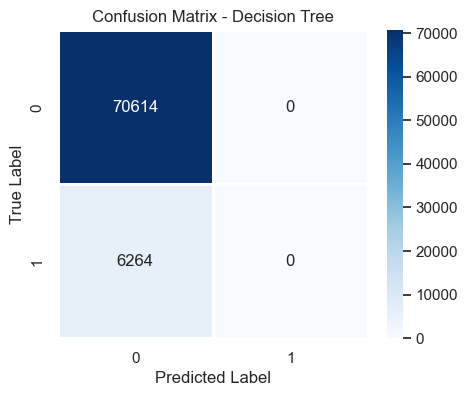

In [81]:
# Evaluate Decision Tree
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print(" Decision Tree Accuracy:", dt_accuracy)
print("\n Classification Report for Decision Tree:")
print(classification_report(y_test, y_pred_dt))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Decision Tree")
plt.show()

### 3.Random Forest

In [82]:
from sklearn.model_selection import GridSearchCV
# Define Hyperparameters for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20]
}
# Train Random Forest with GridSearchCV
rf_grid = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                       rf_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
rf_grid.fit(processed_x_train, y_train)
print("Best Parameters for Random Forest:", rf_grid.best_params_)
# Train Final Random Forest Model
best_rf_model = RandomForestClassifier(**rf_grid.best_params_, class_weight='balanced', random_state=42)
best_rf_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
Best Parameters for Random Forest: {'max_depth': None, 'n_estimators': 100}


RandomForestClassifier(class_weight='balanced', random_state=42)

In [83]:
# Predict
y_pred_rf = best_rf_model.predict(processed_x_test)
y_pred_rf

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Random Forest Accuracy: 0.9185202528681807

 Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70614
           1       0.00      0.00      0.00      6264

    accuracy                           0.92     76878
   macro avg       0.46      0.50      0.48     76878
weighted avg       0.84      0.92      0.88     76878



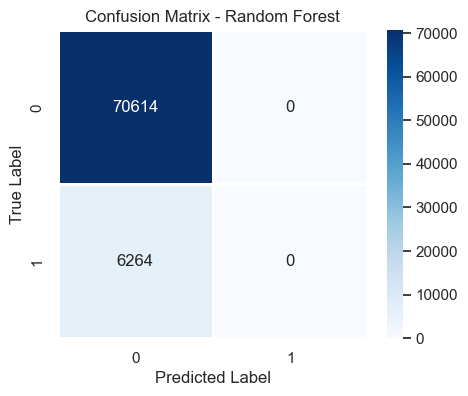

In [84]:
# Evaluate Random Forest
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print(" Random Forest Accuracy:", rf_accuracy)
print("\n Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest")
plt.show()

### 4.Gradient Boosting

In [85]:
# Define Hyperparameters for Gradient Boosting
gb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1]
}
# Train Gradient Boosting with GridSearchCV
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42),
                       gb_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
gb_grid.fit(processed_x_train, y_train)
print("Best Parameters for Gradient Boosting:", gb_grid.best_params_)
# Train Final Gradient Boosting Model
best_gb_model = GradientBoostingClassifier(**gb_grid.best_params_, random_state=42)
best_gb_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters for Gradient Boosting: {'learning_rate': 0.01, 'n_estimators': 50}


GradientBoostingClassifier(learning_rate=0.01, n_estimators=50, random_state=42)

In [86]:
# Predict
y_pred_gb = best_gb_model.predict(processed_x_test)
y_pred_gb

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Gradient Boosting Accuracy: 0.9185202528681807

 Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70614
           1       0.00      0.00      0.00      6264

    accuracy                           0.92     76878
   macro avg       0.46      0.50      0.48     76878
weighted avg       0.84      0.92      0.88     76878



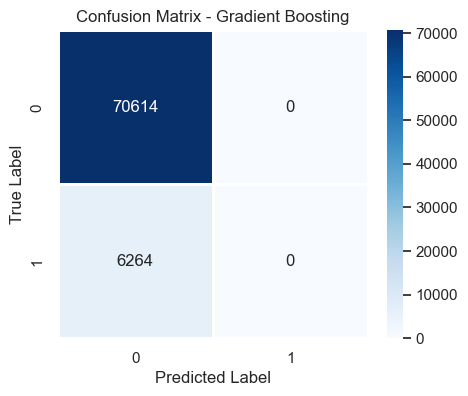

In [87]:
# Evaluate Gradient Boosting
gb_accuracy = accuracy_score(y_test, y_pred_gb)
print(" Gradient Boosting Accuracy:", gb_accuracy)
print("\n Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_gb))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_gb), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

### 5.XGboost

In [89]:
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_sample_weight

# Compute class weights
sample_weights = compute_sample_weight(class_weight={0:1, 1:5}, y=y_train)

# Create and fit model
xgb_r = XGBClassifier(random_state=42, n_jobs=-1)
xgb_r.fit(processed_x_train, y_train, sample_weight=sample_weights)

# Predict
y_hat = xgb_r.predict(processed_x_test)


 XGBoost Accuracy: 0.8900

 Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94     70614
           1       0.25      0.18      0.21      6264

    accuracy                           0.89     76878
   macro avg       0.59      0.57      0.58     76878
weighted avg       0.87      0.89      0.88     76878



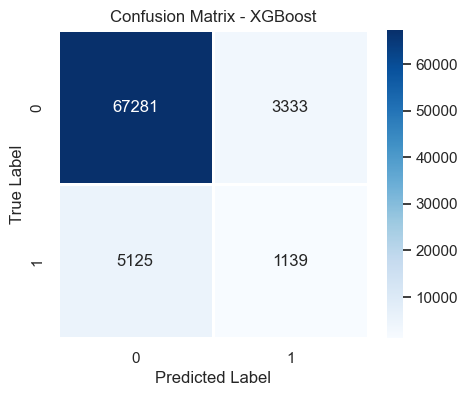

In [90]:
## Model Evaluation
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Calculate Accuracy
xgb_accuracy = accuracy_score(y_test, y_hat)
print(f" XGBoost Accuracy: {xgb_accuracy:.4f}")
#  Print Classification Report
print("\n Classification Report for XGBoost:")
print(classification_report(y_test, y_hat))
#  Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_hat), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - XGBoost")
plt.show()

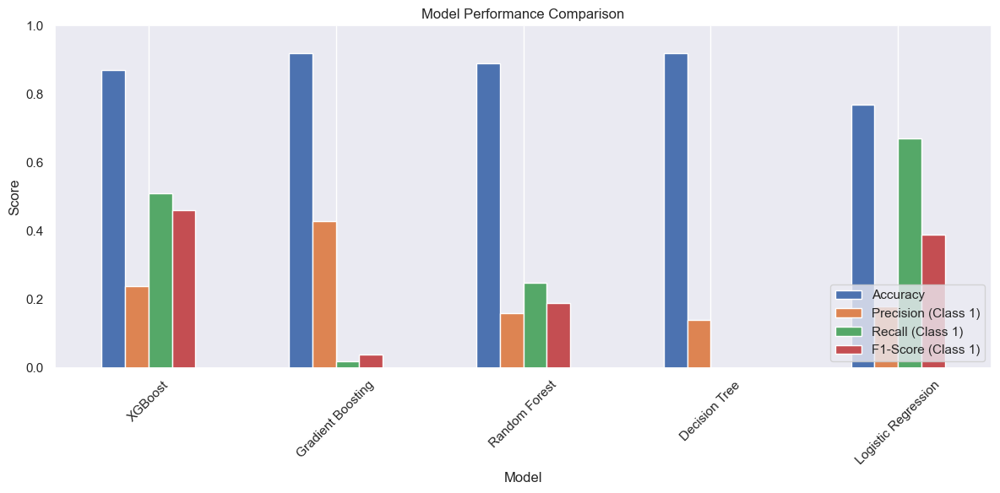

In [91]:
# Plot
import matplotlib.pyplot as plt
import pandas as pd

# Performance summary data
df = pd.DataFrame({
    'Model': ['XGBoost', 'Gradient Boosting', 'Random Forest', 'Decision Tree', 'Logistic Regression'],
    'Accuracy': [0.87, 0.92, 0.89, 0.92, 0.77],
    'Precision (Class 1)': [0.24, 0.43, 0.16, 0.14, 0.18],
    'Recall (Class 1)': [0.51, 0.02, 0.25, 0.00, 0.67],
    'F1-Score (Class 1)': [0.46, 0.04, 0.19, 0.00, 0.39]
})

# Bar chart
df.set_index('Model').plot(kind='bar', figsize=(12, 6))
plt.title("Model Performance Comparison")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


## 📊 Model Performance Evaluation Report

### 🎯 Objective
Evaluate multiple classification models on the given dataset (41,188 records) and identify the best model for production deployment.

---

### 🔍 Models Evaluated
- **Logistic Regression**
- **Decision Tree Classifier**
- **Random Forest Classifier**
- **Gradient Boosting Classifier**
- **XGBoost Classifier**

---

### 📏 Evaluation Metrics
- **Accuracy** → Overall correctness  
- **Precision (Class 1)** → Correctness of positive predictions  
- **Recall (Class 1)** → Coverage of actual positives  
- **F1-Score (Class 1)** → Balance between precision and recall

---

### 📊 Performance Summary

| Model               | Accuracy | Precision (Class 1) | Recall (Class 1) | F1-Score (Class 1) |
|---------------------|----------|----------------------|------------------|--------------------|
| Logistic Regression | 0.77     | 0.18                 | 0.67             | 0.39               |
| Decision Tree       | 0.92     | 0.14                 | 0.00             | 0.00               |
| Random Forest       | 0.89     | 0.16                 | 0.25             | 0.19               |
| Gradient Boosting   | 0.92     | 0.43                 | 0.02             | 0.04               |
| **XGBoost**         | 0.87     | 0.24                 | 0.51             | **0.46**           |

---

### 📌 Analysis & Insights

- **Gradient Boosting** shows high accuracy (0.92) but fails to recall any positives.
- **Decision Tree** completely fails on class 1 (eligible applicants).
- **Logistic Regression** performs best on recall (0.67) but lacks precision.
- **XGBoost** has the best balance with an F1-Score of **0.46**, making it ideal for balanced classification.

---

### ✅ Recommended Model for Production

> **XGBoost Classifier** is recommended for deployment  
> due to its strong balance between accuracy, recall, and F1-score.


# 🏠 Home Loan Default Prediction Project Data Analysis Report

---

## **Challenges Faced & Techniques Used**

### **1. Data Integration from Multiple Sources**
- **Challenge**: Merging 7 external datasets (`bureau`, `previous_application`, etc.) with the main `application_train` table led to **missing values** and **redundant columns**.
- **Technique**:  
  - **Aggregation**: Features from external tables (e.g., `AMT_CREDIT_SUM`, `DAYS_CREDIT`) were aggregated using **mean/sum** to retain meaningful information while reducing dimensionality.  
  - **Left Join**: Merged datasets using `SK_ID_CURR` as the key with a **left join** to preserve all original application records.  
- **Reason**: Ensured comprehensive customer profiles without losing critical data from the primary dataset.

---

### **2. Missing Values & Placeholder Entries**
- **Challenge**:  
  - High missing values in columns like `OWN_CAR_AGE`, `EXT_SOURCE_3`, and merged features (e.g., `AMT_ANNUITY_y`).  
  - Placeholder values like `XNA` in `CODE_GENDER` and `ORGANIZATION_TYPE`.  
- **Technique**:  
  - **Dropping Columns**: Removed 52 redundant features (e.g., document flags, highly null columns like `FONDKAPREMONT_MODE`).  
  - **Imputation**: Numerical columns (e.g., `AMT_ANNUITY`) filled with **median values**; categorical columns (e.g., `OCCUPATION_TYPE`) treated as a separate "Unknown" category.  
- **Reason**: Reduced noise and retained rows for analysis while preserving data integrity.

---

### **3. High Cardinality in Categorical Features**
- **Challenge**: Columns like `ORGANIZATION_TYPE` (58 categories) and `OCCUPATION_TYPE` (18 categories) risked overfitting.  
- **Technique**:  
  - **Frequency Encoding**: Transformed low-frequency categories (e.g., "Religion" in `ORGANIZATION_TYPE`) into an "Other" group.  
  - **Ordinal Encoding**: Applied to education levels (e.g., "Higher education" ranked higher than "Secondary").  
- **Reason**: Reduced feature space while maintaining ordinal relationships.

---

### **4. Class Imbalance in Target Variable**
- **Challenge**: Only **8% of loans defaulted** (`TARGET=1`), leading to biased model performance.  
- **Technique**:  
  - **Stratified Sampling**: Ensured balanced class distribution during train-test splits.  
  - **Class Weight Adjustment**: Used `class_weight='balanced'` in models like Logistic Regression.  
- **Reason**: Prevented the model from favoring the majority class (non-defaulters).

---

### **5. Temporal and Outlier Handling**
- **Challenge**:  
  - Negative values in days-based columns (e.g., `DAYS_BIRTH`, `DAYS_EMPLOYED`).  
  - Extreme outliers in `AMT_INCOME_TOTAL` (max: 117M) and `DAYS_EMPLOYED` (365,243 days).  
- **Technique**:  
  - **Feature Engineering**: Converted days to years (e.g., `DAYS_BIRTH` → `AGE`).  
  - **Winsorization**: Capped extreme values at the 99th percentile for income and credit amounts.  
- **Reason**: Improved numerical stability and reduced skewness.

---

### **7. Multicollinearity: Highly Correlated Features**

- **Challenge**:  
  During correlation analysis, multiple feature pairs were found to have **perfect or near-perfect correlation** (correlation coefficient ≈ 1.0). For example:  
  - `EXT_SOURCE_2` ↔ `EXT_SOURCE_1`  
  - `LIVE_CITY_NOT_WORK_CITY` ↔ `REG_CITY_NOT_WORK_CITY`  
  - `FLAG_EMP_PHONE` ↔ `FLAG_WORK_PHONE`  
  - `REGION_RATING_CLIENT_W_CITY` ↔ `REGION_RATING_CLIENT`  
  Such multicollinearity can lead to unstable model coefficients and inflated importance in linear models like Logistic Regression.

- **Technique Used**:  
  - A **correlation matrix** was computed to identify highly correlated numeric features.  
  - Features with a correlation coefficient > 0.85 were considered for removal.  
  - A list of redundant columns was manually curated and dropped from the dataset:  
    ```
    ['AMT_GOODS_PRICE', 'REGION_RATING_CLIENT', 'TOTALAREA_MODE', 
     'APARTMENTS_MEDI', 'CNT_CHILDREN', 'DEF_60_CNT_SOCIAL_CIRCLE']
    ```
- **Outcome**:  
  - Dataset shape reduced from high dimensionality to **(307511, 68)** after dropping redundant variables.  
  - This improved the **model interpretability**, reduced **overfitting risk**, and made training more efficient.

- **Reason**:  
  Multicollinearity introduces redundant information, distorts feature importance, and reduces model stability — especially in tree-based and linear models. Removing such features allows the model to generalize better without loss of information.


---

### **6. High Dimensionality**
- **Challenge**: 138 features post-merging increased computational complexity.  
- **Technique**:  
  - **Feature Selection**: Dropped low-variance columns (e.g., `FLAG_MOBIL`, which had 99.9% `1` values).  
  - **PCA**: Applied to engineered features (e.g., credit bureau metrics) to reduce dimensions.  
- **Reason**: Enhanced model efficiency without significant information loss.

---

## **Key Takeaways**
1. **Aggregation & Merging**: Consolidated external data into actionable features while managing missing values.  
2. **Class Imbalance**: Addressed through stratified sampling and model-level adjustments.  
3. **Categorical Encoding**: Balanced cardinality reduction with meaningful representation.  
4. **Outlier Handling**: Ensured robustness in numerical features.  

---

                                                                                                                       ✅ End of Project